In [1]:
%pip install tensorflow  matplotlib pandas scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pathlib, random, math, shutil
import pathlib, tensorflow as tf, random
import tensorflow as tf

2025-05-29 16:10:55.642692: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-29 16:10:55.860969: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-29 16:10:55.861055: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-29 16:10:55.893407: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-29 16:10:55.967363: I tensorflow/core/platform/cpu_feature_guar

In [3]:
import pathlib, shutil, random, math

def split_train_test(
        root_dir,                        # carpeta que contiene train_Original/
        source_dir="DATASET",
        test_pct=0.20,
        seed=42,
        delete_existing=True,            # borra train/ y test/ si existen
        dry_run=False                    # True → solo muestra acciones
    ):
    """
    Copia las imágenes de source_dir en carpetas nuevas
    con la proporción  (1 - test_pct) / test_pct  (por defecto 80 / 20).

    Si `delete_existing` es True, elimina cualquier train/ o test/ previo.
    Acepta extensiones .jpg/.jpeg/.png.
    """
    root    = pathlib.Path(root_dir)
    src_dir = root / source_dir
    assert src_dir.exists(), f"No se encontró '{source_dir}'"

    # Borrar divisiones anteriores
    if delete_existing:
        for name in ("train", "test"):
            target = root / name
            if target.exists():
                if dry_run:
                    print(f"[DRY RUN] Eliminaría {target}")
                else:
                    shutil.rmtree(target)

    random.seed(seed)

    # Recorrer cada clase y copiar
    for cls_dir in src_dir.iterdir():
        if not cls_dir.is_dir():
            continue                                 
        imgs = [p for p in cls_dir.iterdir()
                if p.suffix.lower() in {".jpg", ".jpeg", ".png"}]
        if not imgs:
            continue

        random.shuffle(imgs)
        n_test      = math.floor(len(imgs) * test_pct)
        test_imgs   = imgs[:n_test]
        train_imgs  = imgs[n_test:]

        for split, split_imgs in [("train", train_imgs), ("test", test_imgs)]:
            dest = root / split / cls_dir.name
            if not dry_run:
                dest.mkdir(parents=True, exist_ok=True)

            for img in split_imgs:
                if dry_run:
                    print(f"[{split.upper()}] copiaría {img.name} -> {dest}")
                else:
                    shutil.copy2(img, dest)

    if dry_run:
        print("DRY RUN.")
    else:
        print("División 80-20 completada con copia y reemplazo de carpetas.")

DATASET_DIR = "./"
split_train_test(DATASET_DIR, dry_run=False)


División 80-20 completada con copia y reemplazo de carpetas.


In [4]:
from collections import Counter

def count_split(path):
    c = Counter(p.parent.name for p in pathlib.Path(path).rglob('*') if p.suffix.lower() in {'.jpg','.jpeg','.png'})
    total = sum(c.values())
    return total, c

for split in ("train", "test"):
    tot, cls = count_split(DATASET_DIR + "/" + split)
    print(f"{split.upper():5}  {tot} imágenes")
    print("   " + ", ".join(f"{k}:{v}" for k,v in cls.items()))


TRAIN  6796 imágenes
   trap-jaw-ants:520, black-crazy-ants:710, leafcutter-ants:1017, yellow-crazy-ants:753, argentine-ants:1629, weaver-ants:935, fire-ants:1232
TEST   1696 imágenes
   trap-jaw-ants:129, black-crazy-ants:177, leafcutter-ants:254, yellow-crazy-ants:188, argentine-ants:407, weaver-ants:233, fire-ants:308


In [5]:
# Procesar los datos
IMG_SIZE = (256,256)
BATCH    = 16


In [6]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from PIL import Image, ImageOps

def random_contrast(img):
    """
    Recibe un tensor [H, W, 3] en rango 0-1 y devuelve la misma imagen
    con contraste multiplicado por un factor aleatorio.
    """
    # ImageDataGenerator entrega un array float32 ya re-escalado (0-1)
    factor = tf.random.uniform([], 0.7, 1.3)
    img_tf = tf.image.adjust_contrast(img, factor)
    return img_tf.numpy()


# Clases a ignorar
IGNORE = []
root   = pathlib.Path("./")  

# Lista completa de carpetas dentro de train/
all_classes     = sorted([d.name for d in (root/"train").iterdir() if d.is_dir()])
include_classes = [c for c in all_classes if c not in IGNORE]

print("Classes usadas :", include_classes)
print("Classes ignoradas:", IGNORE)

train_datagen = ImageDataGenerator(
    rescale             = 1./255,
    rotation_range      = 20,
    width_shift_range   = 0.25,
    height_shift_range  = 0.25,
    zoom_range          = (0.7, 1.3),
    horizontal_flip     = True,
    vertical_flip       = True,
    fill_mode           = "wrap",
    brightness_range    = (0.7, 1.3),
    preprocessing_function = lambda img: random_contrast(img),
    validation_split    = 0.15
)

val_datagen = ImageDataGenerator(
    rescale          = 1./255,
    validation_split = 0.15        # mismo valor para que el split coincida
)

test_datagen = ImageDataGenerator(rescale = 1./255)

train_gen = train_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "train"),
    classes      = include_classes,
    target_size  = IMG_SIZE,
    batch_size   = BATCH,
    subset       = "training",      # se queda con el 85 % para entrenamiento
    class_mode   = "categorical",
    shuffle      = True,
    seed         = 42               # usa la MISMA semilla para ambos splits
)

val_gen = val_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "train"),
    classes      = include_classes,
    target_size  = IMG_SIZE,
    batch_size   = BATCH,
    subset       = "validation",    # el 15 % restante, sin aumentos
    class_mode   = "categorical",
    shuffle      = False,           # no es necesario barajar
    seed         = 42               # misma semilla que arriba
)

test_gen = test_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "test"),
    classes      = include_classes,
    target_size  = IMG_SIZE,
    batch_size   = BATCH,
    class_mode   = "categorical",
    shuffle      = False
)


Classes usadas : ['argentine-ants', 'black-crazy-ants', 'fire-ants', 'leafcutter-ants', 'trap-jaw-ants', 'weaver-ants', 'yellow-crazy-ants']
Classes ignoradas: []
Found 5780 images belonging to 7 classes.
Found 1016 images belonging to 7 classes.
Found 1696 images belonging to 7 classes.


2025-05-29 16:11:03.770080: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-29 16:11:03.820301: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-29 16:11:03.820367: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-29 16:11:03.822421: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2025-05-29 16:11:03.822457: I external/local_xla/xla/stream_executor

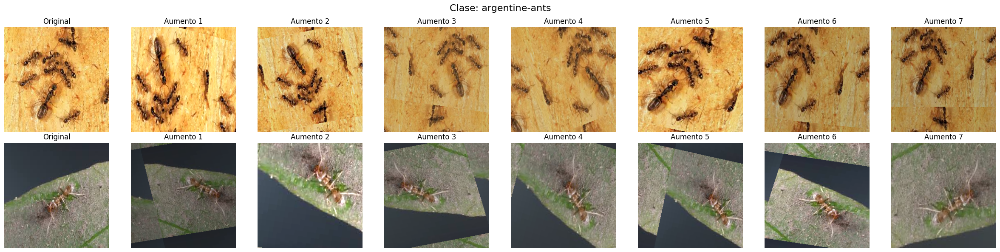

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15196379..1.0256201].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033427007..1.0243678].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1237403..1.0643753].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08452319..0.9383598].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015168026..1.0063188].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1569903..1.0714902].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.

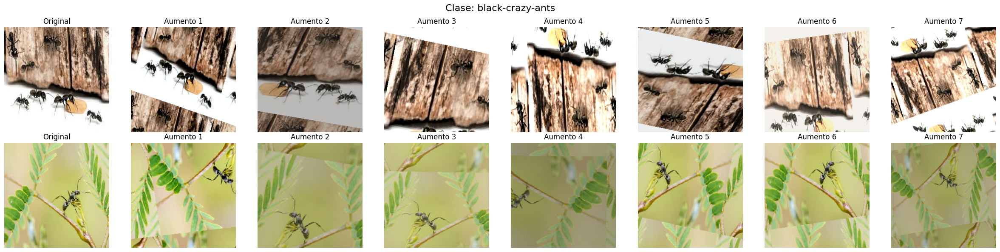

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04513089..1.0015628].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009714761..0.9124149].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04485518..0.7799598].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0035609677..0.76771456].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022211596..0.96716076].


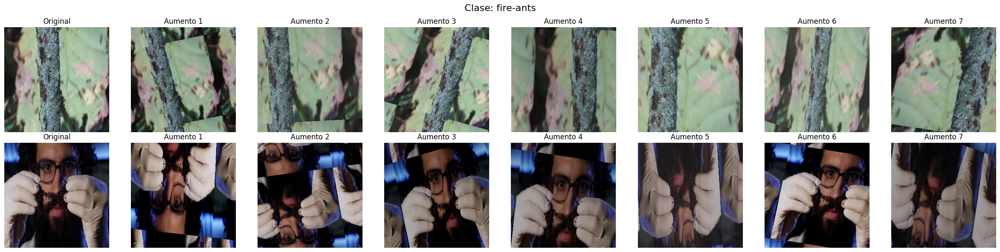

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05746146..0.79942137].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10391087..1.1992508].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011845933..1.0207443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02804712..0.77737635].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.027951688..1.0486493].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.105764315..1.0321754].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range

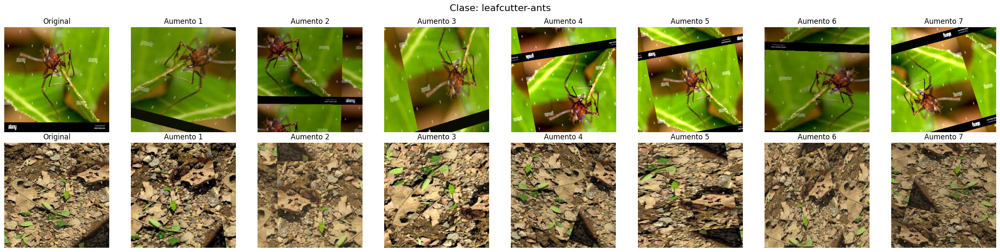

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010607599..0.8559363].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04692188..0.8183227].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02134421..0.8463355].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17619216..1.0615205].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.120709725..0.87959266].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10814033..0.99326].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0

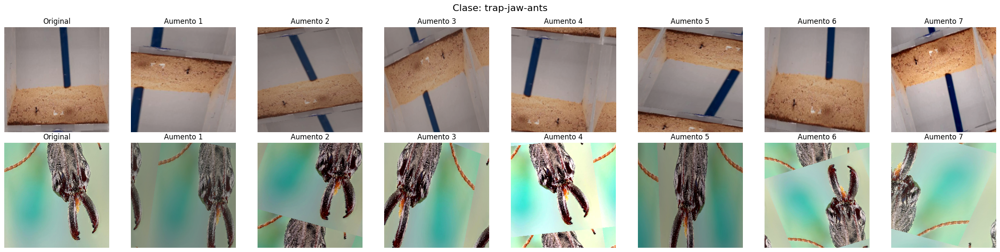

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051691312..1.2135035].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0038789206..0.7329004].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14900503..1.1447103].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04745328..1.0373261].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07187789..1.0500429].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06338356..1.0478697].


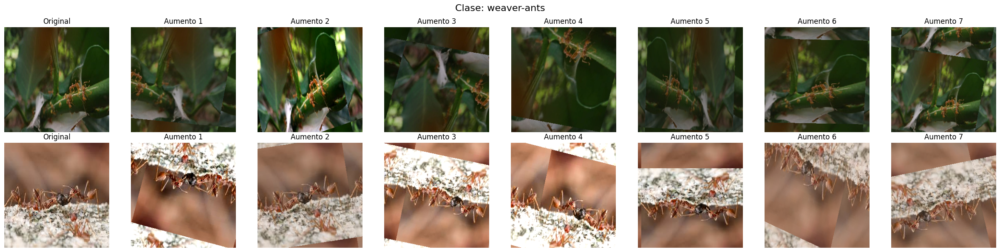

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11892118..1.1808736].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11841386..1.1849334].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1357406..0.87005514].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035015307..1.005926].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025089819..0.74612296].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.030572128..0.9710771].


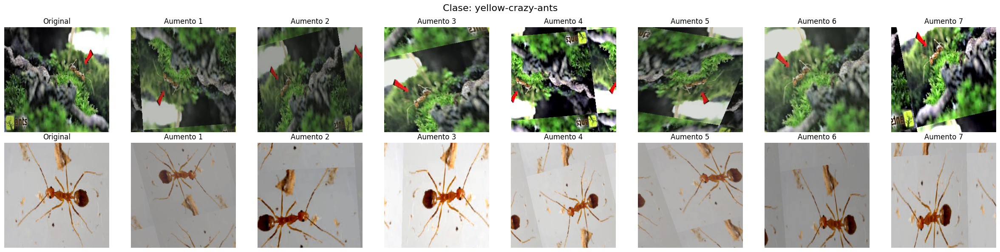

In [7]:
import os, random, numpy as np, matplotlib.pyplot as plt, tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Generador SIN aumentos (solo rescale) para extraer originales
base_datagen = ImageDataGenerator(rescale=1./255)
images_per_class = 2
augs_per_class = 7

def sample_originals(class_name):
    """Devuelve imágenes (float32 0-1) de la clase pedida."""
    class_dir = os.path.join(DATASET_DIR, "train", class_name)
    img_files = [os.path.join(class_dir, f)
                 for f in os.listdir(class_dir)
                 if f.lower().endswith((".jpg", ".jpeg", ".png"))]

    if len(img_files) == 0:
        raise ValueError(f"No se encontraron imágenes para {class_name}")

    # Si hay menos de 3 imágenes, se repiten para completar
    chosen = random.choices(img_files, k=images_per_class)

    imgs = []
    for f in chosen:
        img = tf.keras.utils.load_img(f, target_size=IMG_SIZE)
        img = tf.keras.utils.img_to_array(img) / 255.0
        imgs.append(img)
    return imgs  # lista de imagenes

for class_name in include_classes:
    originals = sample_originals(class_name)
    rows, cols = images_per_class, augs_per_class + 1
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    fig.suptitle(f"Clase: {class_name}", fontsize=16)

    for r, orig_img in enumerate(originals):
        # Original 
        axes[r, 0].imshow(orig_img)
        axes[r, 0].set_title("Original")
        axes[r, 0].axis("off")

        # Cuatro aumentos 
        img_uint8 = (orig_img * 255).astype(np.uint8)
        aug_iter  = train_datagen.flow(np.expand_dims(img_uint8, 0),
                                       batch_size=1, shuffle=False)
        for c in range(augs_per_class):
            aug_img = next(aug_iter)[0]      # ya viene float32 0-1
            axes[r, c + 1].imshow(aug_img)
            axes[r, c + 1].set_title(f"Aumento {c + 1}")
            axes[r, c + 1].axis("off")

    plt.tight_layout()
    plt.show()


In [8]:
# Equilibrio de pesos en clases 
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced',
                               classes=np.unique(train_gen.classes),
                               y=train_gen.classes)
class_weight = dict(enumerate(weights))


In [9]:
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import EfficientNetV2B0

# Base EfficientNetV2B0
base = EfficientNetV2B0(
    weights='imagenet',
    include_top=False,
    input_shape=IMG_SIZE + (3,)
)
base.trainable = True

# Encadenamos las capas finales
model = models.Sequential([
    base,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(train_gen.num_classes, activation='softmax')
])

model.compile(
    optimizer=optimizers.Adam(learning_rate=0.000015),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-b0 (Functio  (None, 8, 8, 1280)        5919312   
 nal)                                                            
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 256)               327936    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 7)                 1799      
                                                                 
Total params: 6249047 (23.84 MB)
Trainable params: 61884

In [10]:
class TestPerformance(tf.keras.callbacks.Callback):
    def __init__(self, test_data):
        super().__init__()
        self.test_data = test_data
        self.test_losses = []
        self.test_accs   = []

    def on_epoch_end(self, epoch, logs=None):
        loss, acc = self.model.evaluate(
            self.test_data,
            verbose=0
        )
        self.test_losses.append(loss)
        self.test_accs.append(acc)
        logs = logs or {}
        logs["test_loss"] = loss
        logs["test_accuracy"] = acc

test_callback = TestPerformance(test_gen)

In [11]:
from tensorflow.keras.callbacks import EarlyStopping

history = model.fit(
    train_gen,
    epochs=80,
    steps_per_epoch=100,
    validation_data=val_gen,
    class_weight=class_weight,
    callbacks=[test_callback, EarlyStopping(monitor='test_accuracy', patience=10, restore_best_weights=True)]
)

Epoch 1/80


2025-05-29 16:11:25.635666: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/efficientnetv2-b0/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2025-05-29 16:11:27.572825: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-05-29 16:11:29.945761: I external/local_xla/xla/service/service.cc:168] XLA service 0x7cbb14803d00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-29 16:11:29.945796: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti Laptop GPU, Compute Capability 8.6
2025-05-29 16:11:29.957556: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1748556690.036794    1468 device_comp

100/100 [==============================] - 64s 330ms/step - loss: 2.0020 - accuracy: 0.1950 - val_loss: 1.8952 - val_accuracy: 0.2028 - test_loss: 1.8782 - test_accuracy: 0.2588
Epoch 2/80
100/100 [==============================] - 35s 346ms/step - loss: 1.9028 - accuracy: 0.2689 - val_loss: 1.8383 - val_accuracy: 0.2894 - test_loss: 1.8151 - test_accuracy: 0.3420
Epoch 3/80
100/100 [==============================] - 34s 336ms/step - loss: 1.7928 - accuracy: 0.3344 - val_loss: 1.7941 - val_accuracy: 0.3337 - test_loss: 1.7562 - test_accuracy: 0.4210
Epoch 4/80
100/100 [==============================] - 34s 339ms/step - loss: 1.7097 - accuracy: 0.3963 - val_loss: 1.7437 - val_accuracy: 0.3248 - test_loss: 1.6696 - test_accuracy: 0.4375
Epoch 5/80
100/100 [==============================] - 35s 351ms/step - loss: 1.6406 - accuracy: 0.4150 - val_loss: 1.6444 - val_accuracy: 0.3720 - test_loss: 1.5826 - test_accuracy: 0.4847
Epoch 6/80
100/100 [==============================] - 34s 339ms/st

In [12]:
test_loss, test_acc = model.evaluate(test_gen)
print(f"Precisión en test: {test_acc:.2%}")

106/106 [==============================] - 4s 34ms/step - loss: 0.5500 - accuracy: 0.8137
Precisión en test: 81.37%


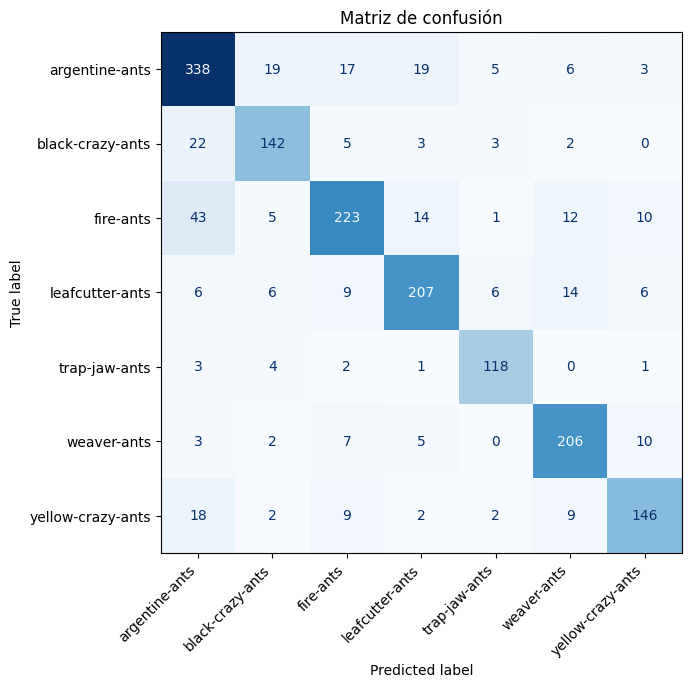

                   precision    recall  f1-score   support

   argentine-ants       0.78      0.83      0.80       407
 black-crazy-ants       0.79      0.80      0.80       177
        fire-ants       0.82      0.72      0.77       308
  leafcutter-ants       0.82      0.81      0.82       254
    trap-jaw-ants       0.87      0.91      0.89       129
      weaver-ants       0.83      0.88      0.85       233
yellow-crazy-ants       0.83      0.78      0.80       188

         accuracy                           0.81      1696
        macro avg       0.82      0.82      0.82      1696
     weighted avg       0.81      0.81      0.81      1696



In [13]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

gen = test_gen

y_pred_prob = model.predict(gen, verbose=0)
y_pred      = np.argmax(y_pred_prob, axis=1)
y_true      = gen.classes

cm = confusion_matrix(y_true, y_pred)
labels = list(gen.class_indices.keys())   # nombres de las clases

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(7,7))
disp.plot(ax=ax, cmap="Blues", colorbar=False, values_format="d")
plt.xticks(rotation=45, ha="right")
plt.title("Matriz de confusión")
plt.tight_layout()
plt.show()

print(classification_report(y_true, y_pred, target_names=labels))


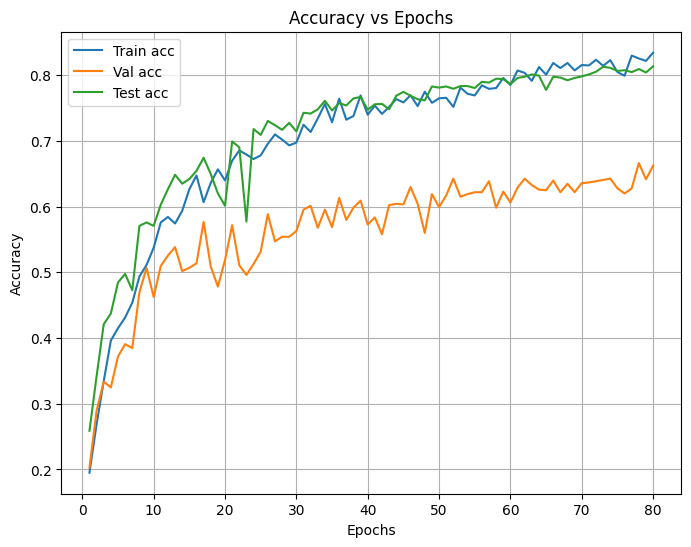

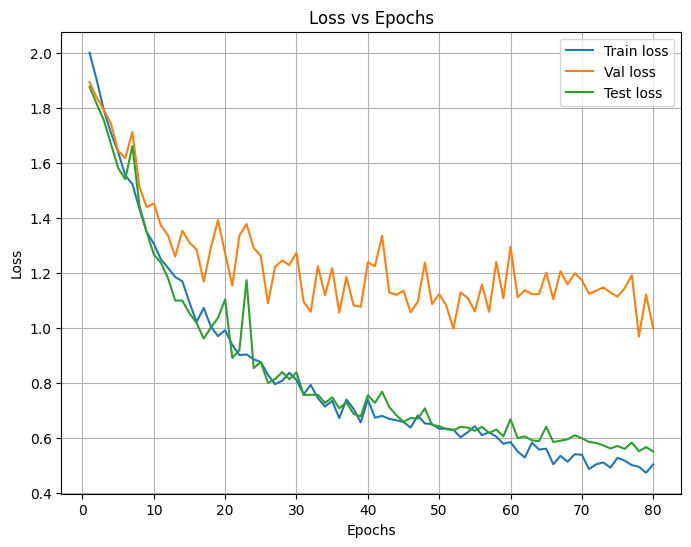

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert history to DataFrame
frame = pd.DataFrame(history.history)
frame["test_loss"]      = test_callback.test_losses
frame["test_accuracy"]  = test_callback.test_accs
epochs = frame.index + 1

# Accuracy vs Epochs
plt.figure(figsize=(8, 6))
plt.plot(epochs, frame["accuracy"], label="Train acc")
plt.plot(epochs, frame["val_accuracy"], label="Val acc")
plt.plot(epochs, frame["test_accuracy"], label="Test acc")
plt.title("Accuracy vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Loss vs Epochs
plt.figure(figsize=(8, 6))
plt.plot(epochs, frame["loss"], label="Train loss")
plt.plot(epochs, frame["val_loss"], label="Val loss")
plt.plot(epochs, frame["test_loss"], label="Test loss")
plt.title("Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


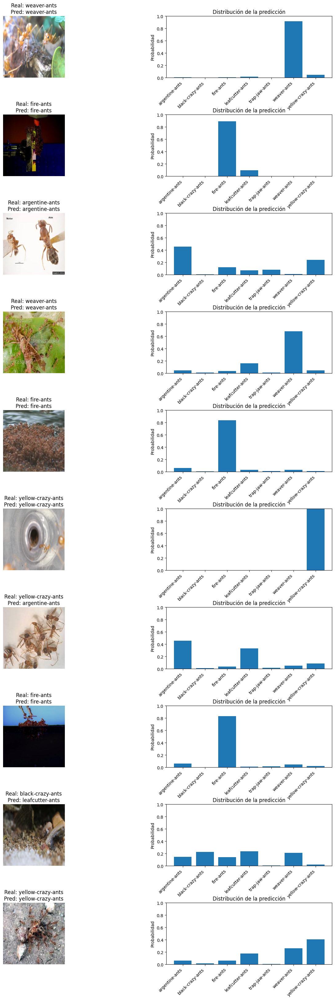

In [15]:
import numpy as np
import matplotlib.pyplot as plt

#config
NUM_SAMPLES = 10
class_names = list(test_gen.class_indices.keys())
num_classes = len(class_names)

# recopilar TODO el test set
imgs, labels = [], []
for i in range(len(test_gen)):            # len(test_gen) = numero de lotes
    batch_imgs, batch_lbls = test_gen[i]  # ya son np.arrays
    imgs.append(batch_imgs)
    labels.append(batch_lbls)

imgs   = np.concatenate(imgs, axis=0)
labels = np.concatenate(labels, axis=0)

# elegir N ejemplos al azar
idx            = np.random.choice(len(imgs), NUM_SAMPLES, replace=False)
sample_imgs    = imgs[idx]
sample_labels  = np.argmax(labels[idx], axis=1)

# predicciones
preds = model.predict(sample_imgs, verbose=0)

# dibujar
fig, axes = plt.subplots(NUM_SAMPLES, 2, figsize=(16, 4 * NUM_SAMPLES))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for i, (img, true_idx, pred_vec) in enumerate(zip(sample_imgs,
                                                  sample_labels,
                                                  preds)):
    # Columna de la imagen
    axes[i, 0].imshow((img * 255).astype("uint8"))   # ⇐ reescala para mostrar
    axes[i, 0].axis("off")
    axes[i, 0].set_title(f"Real: {class_names[true_idx]}\n"
                         f"Pred: {class_names[np.argmax(pred_vec)]}")

    # Columna de la distribución
    axes[i, 1].bar(range(num_classes), pred_vec)
    axes[i, 1].set_xticks(range(num_classes))
    axes[i, 1].set_xticklabels(class_names, rotation=45, ha="right")
    axes[i, 1].set_ylim([0, 1])
    axes[i, 1].set_ylabel("Probabilidad")
    axes[i, 1].set_title("Distribución de la predicción")

plt.show()



In [16]:
# Guardar el modelo
import datetime

test_loss, test_acc = model.evaluate(test_gen, verbose=0) 
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M")

model_name = f"modelo_{timestamp}_testAcc{test_acc:.2f}.256.h5"

model.save(model_name)
print(f"Modelo guardado como: {model_name}")


/home/pablo/miniconda3/envs/tf216/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado como: modelo_20250529_1655_testAcc0.81.256.h5
